### Stellar Metallicity Distribution over Milky Way Galaxy ###

- We aim to find the patterns in the stellar metallicity([M/H]) and $\alpha$ element abundance([$\alpha/Fe$]) from our galaxy.
- Stellar metallicity is the measure of elements heavier than the He in the star
- It is measured with respect to our sun and given by  :
                          [M/H] = log10((M/H)/(M/H)☉)
- Similar $[\alpha/Fe]$ is measure of the $\alpha$ elements in the sun. $\alpha$ elements are the elements which are generated by the  $\alpha$ process.
- Studying this will help us to understand the galactic archeology, evolution and the current state of milky way.

In [5]:
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import numpy as np
from astropy.io.votable import parse
from astropy.table import Table, vstack
from astropy.io import fits
#import healpy as hp
import gc

We have used the data from the GAIA DR3, to study the metallicity distribution in the galaxy.
Gaia is a space observatory launched by the ESA in 2013, whose aim is to make a general 3D catalogue of the astronomical objects with high precision parameter measurements.

We took the data from the Astrophysical_parameters, Gaiaedr3_Distance, and Gaia_Source tables.
We downloaded the data in two parts as with latitude >=0 and latitude<0, as Gaia limits the downloading automatically for the large dataset 

In [ ]:
# Downloading the data for b>=0

Gaia.ROW_LIMIT = -1
query = """
SELECT

    ap.teff_gspspec_upper,gs.bp_rp,ap.logg_gspspec_lower,
    gs.dec,ap.mh_gspspec_upper,gs.dec_error,gs.pm,gs.parallax_over_error,gs.pmdec_error,gs.b,
    ap.teff_gspspec,gs.parallax,ap.mh_gspspec,gs.source_id,gs.ra_error,ap.teff_gspspec_lower,
    gs.radial_velocity_error,gs.l,gs.radial_velocity,gs.ra,gs.pmdec,ap.logg_gspspec_upper,
    ap.alphafe_gspspec,ap.logg_gspspec,gs.phot_g_mean_mag,gs.pmra_error,ap.alphafe_gspspec_upper,
    ap.alphafe_gspspec_lower,ap.flags_gspspec,ap.mh_gspspec_lower,d.r_med_geo,ap.ag_gspphot,
    ap.ebpminrp_gspphot,ap.azero_gspphot,gs.phot_g_mean_flux_over_error,gs.phot_bp_rp_excess_factor,
    ap.lum_flame,ap.lum_flame_lower,ap.lum_flame_upper,
    ap.mass_flame,ap.mass_flame_lower,ap.mass_flame_upper,ap.age_flame,ap.age_flame_lower,
    ap.age_flame_upper,ap.radius_flame,ap.radius_flame_lower,ap.radius_flame_upper,gs.pmra
    
FROM gaiadr3.gaia_source AS gs
JOIN gaiadr3.astrophysical_parameters AS ap ON gs.source_id = ap.source_id
JOIN external.gaiaedr3_distance AS d ON gs.source_id = d.source_id
WHERE ((ap.teff_gspspec >= 3800) OR (ap.logg_gspspec >= 3.5))
  AND ((ap.teff_gspspec >= 4150) OR (ap.logg_gspspec >= 3.6) OR (ap.logg_gspspec <= 2.4))
  AND d.r_med_geo IS NOT NULL
  AND gs.b>=0;
Gaia.ROW_LIMIT = -1
"""

job = Gaia.launch_job_async(query,dump_to_file=True,output_format='fits')
print(job)

In [ ]:
# Downloading the data for b<0

Gaia.ROW_LIMIT = -1
query = """
SELECT

    ap.teff_gspspec_upper,gs.bp_rp,ap.logg_gspspec_lower,
    gs.dec,ap.mh_gspspec_upper,gs.dec_error,gs.pm,gs.parallax_over_error,gs.pmdec_error,gs.b,
    ap.teff_gspspec,gs.parallax,ap.mh_gspspec,gs.source_id,gs.ra_error,ap.teff_gspspec_lower,
    gs.radial_velocity_error,gs.l,gs.radial_velocity,gs.ra,gs.pmdec,ap.logg_gspspec_upper,
    ap.alphafe_gspspec,ap.logg_gspspec,gs.phot_g_mean_mag,gs.pmra_error,ap.alphafe_gspspec_upper,
    ap.alphafe_gspspec_lower,ap.flags_gspspec,ap.mh_gspspec_lower,d.r_med_geo,ap.ag_gspphot,
    ap.ebpminrp_gspphot,ap.azero_gspphot,gs.phot_g_mean_flux_over_error,gs.phot_bp_rp_excess_factor,
    ap.lum_flame,ap.lum_flame_lower,ap.lum_flame_upper,
    ap.mass_flame,ap.mass_flame_lower,ap.mass_flame_upper,ap.age_flame,ap.age_flame_lower,
    ap.age_flame_upper,ap.radius_flame,ap.radius_flame_lower,ap.radius_flame_upper,gs.pmra
    
FROM gaiadr3.gaia_source AS gs
JOIN gaiadr3.astrophysical_parameters AS ap ON gs.source_id = ap.source_id
JOIN external.gaiaedr3_distance AS d ON gs.source_id = d.source_id
WHERE ((ap.teff_gspspec >= 3800) OR (ap.logg_gspspec >= 3.5))
  AND ((ap.teff_gspspec >= 4150) OR (ap.logg_gspspec >= 3.6) OR (ap.logg_gspspec <= 2.4))
  AND d.r_med_geo IS NOT NULL
  AND gs.b<0;
Gaia.ROW_LIMIT = -1
"""

job = Gaia.launch_job_async(query,dump_to_file=True,output_format='fits')
print(job)

In [ ]:
# Read the tables
table1 = Table.read('/content/drive/MyDrive/GRB/1744217492840O-result.fits', memmap=True, hdu=1)
table2 = Table.read('/content/drive/MyDrive/GRB/1744216763522O-result.fits', memmap=True, hdu=1)

# Convert to Pandas DataFrame 
df1 = table1.to_pandas()
df2 = table2.to_pandas()

import dask.dataframe as dd
#Conver the dataframes to dask dataframes for merging
dask_df1 = dd.from_pandas(df1, npartitions=10)
dask_df2 = dd.from_pandas(df2, npartitions=10)

# Concatenate the Dask DataFrames
combined_dask_df = dd.concat([dask_df1, dask_df2])
# Saveto CSV files
combined_dask_df.to_csv('final_data_1.csv', single_file=True, index=False)

In [6]:
!gdown --id 1cQKXZFx6mblVuz0X4lfJnplklA73yogN

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1cQKXZFx6mblVuz0X4lfJnplklA73yogN
From (redirected): https://drive.google.com/uc?id=1cQKXZFx6mblVuz0X4lfJnplklA73yogN&confirm=t&uuid=9f81b71d-c622-4fb3-9090-ae958777b141
To: /kaggle/working/final_data_1.csv
100%|███████████████████████████████████████| 2.58G/2.58G [00:16<00:00, 155MB/s]


In [7]:
#load the dataset
data = pd.read_csv("final_data_1.csv")

# Filter out the dataset using parallax over error which is nothing but parallax/error
data = data[data['parallax_over_error']>5]

Here we are plotting the sky maps of our downloaded data and with also the [M/H] and [$\alpha/Fe$] mapping.
It will help us to understand the selected data distribution and also will help us to understand the clusters of metal rich or poor stars in the galaxy

<Figure size 1000x600 with 0 Axes>

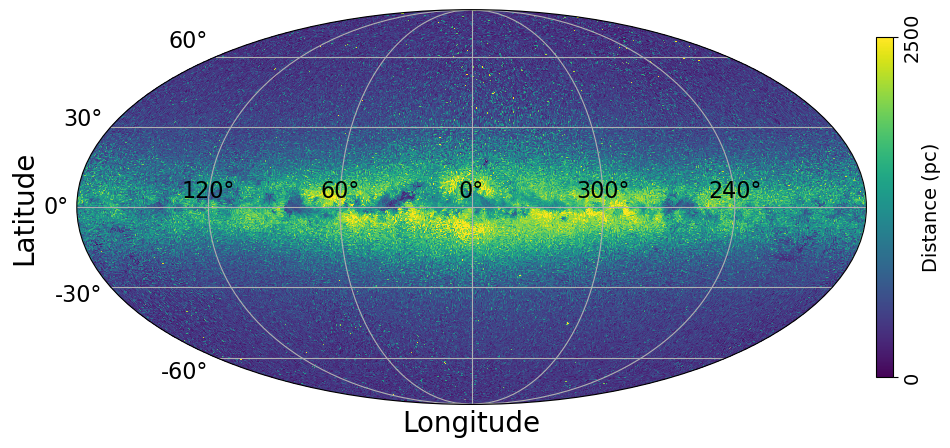

4608

In [5]:
# Extract columns
# we will plot the latitude, longitude of each star and map with the median of stellar distance from the sun 
l = data["l"]
b = data["b"]
rGeo = data["r_med_geo"]

#drop the nan values
valid = ~np.isnan(l) & ~np.isnan(b) & ~np.isnan(rGeo)
l, b, rGeo = l[valid], b[valid], rGeo[valid]

# Nside will give the resolution to the plot, it is giving 0.46deg with 128
NSIDE = 128
pixels = hp.ang2pix(NSIDE, l, b, lonlat=True)

df = pd.DataFrame({'pixel': pixels, 'distance': rGeo})
median_values = df.groupby('pixel')['distance'].median()

# start healpix map 
npix = hp.nside2npix(NSIDE)
map_array = np.full(npix, np.nan)
#computing the median
map_array[median_values.index] = median_values.values  

# Plot
plt.figure(figsize=(10,6))

#fill with computed medians
hp.projview(
    map_array,coord=["G"],graticule=True,graticule_labels=True,cmap="viridis",unit=r"Distance (pc)", min=0, max=2500,
    xlabel="Longitude",ylabel="Latitude",
    fontsize={
        "xlabel": 20,
        "ylabel": 20,
        "xtick_label": 16,
        "ytick_label": 16,
        "title": 20,
        "cbar_label": 14,
        "cbar_tick_label": 14,
    },
    cb_orientation="vertical",
    projection_type="mollweide",
)
hp.graticule()
plt.savefig("Stellar data.png",bbox_inches="tight")
plt.show()
del rGeo, pixels, df, median_values
gc.collect()

<Figure size 1000x600 with 0 Axes>

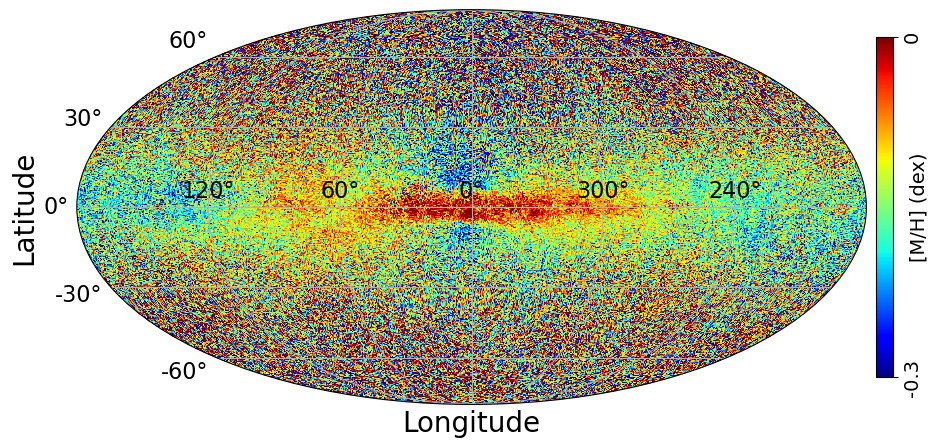

4567

In [6]:
mh = data["mh_gspspec"]

valid = ~np.isnan(l) & ~np.isnan(b) & ~np.isnan(mh)
l, b, mh = l[valid], b[valid], mh[valid]

NSIDE = 128
pixels = hp.ang2pix(NSIDE, l, b, lonlat=True)

df = pd.DataFrame({'pixel': pixels, '[M/H]': mh})
median_values = df.groupby('pixel')['[M/H]'].median()

npix = hp.nside2npix(NSIDE)
map_array = np.full(npix, np.nan)
map_array[median_values.index] = median_values.values  

# Plot
plt.figure(figsize=(10,6))
hp.projview(
    map_array,coord=["G"],graticule=True,graticule_labels=True,cmap="jet",unit=r"[M/H] (dex)", min=-0.3, max=0.0,
    xlabel="Longitude",ylabel="Latitude",
    fontsize={
        "xlabel": 20,
        "ylabel": 20,
        "xtick_label": 16,
        "ytick_label": 16,
        "title": 20,
        "cbar_label": 14,
        "cbar_tick_label": 14,
    },
    cb_orientation="vertical",
    projection_type="mollweide",
)

hp.graticule()
plt.savefig("M_H_over_galaxy.png",bbox_inches="tight")

plt.show()
del pixels, df, median_values
gc.collect()

<Figure size 1000x600 with 0 Axes>

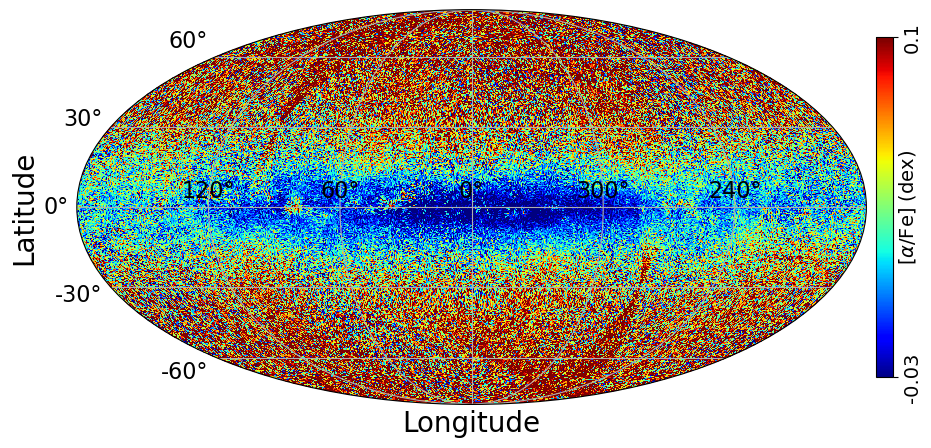

5504

In [7]:
alpha_fe = data["alphafe_gspspec"]

valid = ~np.isnan(l) & ~np.isnan(b) & ~np.isnan(alpha_fe)
l, b, alpha_fe = l[valid], b[valid], alpha_fe[valid]

NSIDE = 128
pixels = hp.ang2pix(NSIDE, l, b, lonlat=True)

df = pd.DataFrame({'pixel': pixels, '[alpha_fe/Fe]': alpha_fe})
median_values = df.groupby('pixel')['[alpha_fe/Fe]'].median()

npix = hp.nside2npix(NSIDE)
map_array = np.full(npix, np.nan)
map_array[median_values.index] = median_values.values  

plt.figure(figsize=(10,6))
hp.projview(
    map_array,
    coord=["G"],
    graticule=True,
    graticule_labels=True
    , cmap="jet",
    unit=r"[$\alpha$/Fe] (dex)"
    , min=-0.03, max=0.1,
    xlabel="Longitude",
    ylabel="Latitude",
    fontsize={
        "xlabel": 20,
        "ylabel": 20,
        "xtick_label": 16,
        "ytick_label": 16,
        "title": 20,
        "cbar_label": 14,
        "cbar_tick_label": 14,
    },
    cb_orientation="vertical",
    projection_type="mollweide",
)

plt.savefig('alphafe_over_galaxy.png',bbox_inches="tight")

plt.show()
del pixels, df, median_values
gc.collect()

In the following cell, we are getting the coordinates of each source in the Galactocentric system, in which the radial distance(R) is the distance from the galaxy centre and the vertical distance(Z) is the perpendicular distance of a source from the galaxy. This is done by taking the RA, DEC and median geometric distance from the earth to the source.
We have used the Galactocentric library from astropy which transforms the ICRS coordinate system to the galactocentri system.

In [8]:
from astropy.coordinates import SkyCoord, Galactocentric
from astropy import units as u
from astropy.coordinates import ICRS

df = pd.DataFrame(data)

# Getting the radial and perpendicular distances of the sources 
#Create SkyCoord objects 
coords = SkyCoord(ra=df['ra'].values*u.deg,
                  dec=df['dec'].values*u.deg,
                  distance=df['r_med_geo'].values*u.pc,
                  frame='icrs')

# generate the Galactocentric frame
galcen_frame = Galactocentric()

# Transform the coordinates to Galactocentric frame
galcen_coords = coords.transform_to(galcen_frame)

# R is the radial distance and Z is the vertical distance from the plane.

df['R_kpc'] = np.sqrt(galcen_coords.x.value**2 + galcen_coords.y.value**2) / 1000.0  # convert to kpc
df['Z_kpc'] = galcen_coords.z.value / 1000.0  # convert to kpc

print(df[['R_kpc', 'Z_kpc', 'mh_gspspec']].head())

      R_kpc     Z_kpc  mh_gspspec
0  6.928477  0.183054       -0.20
1  6.460393  0.252107        0.15
2  6.855503  0.185753       -0.01
3  5.061775  0.420544       -0.20
4  1.520036  0.941337       -1.14


In [9]:
del galcen_coords
del coords
gc.collect()

144

Dropped the nan values from the columns which will be using for the following analysis part. We are not removing all nan values as in the below analysis we will not use some columns which might have large nan values and it will remove the useful data also.

In [10]:
#Drop nan values fromt the columns which will be using currently
df_subset = df.dropna(subset=['R_kpc', 'Z_kpc', 'mh_gspspec', 'alphafe_gspspec',
                              'teff_gspspec', 'phot_g_mean_mag', 'bp_rp', 'logg_gspspec',
                              'parallax_over_error', 'parallax','radial_velocity', 'radial_velocity_error', 'pm'])

In the following analysis we are plotting the spatial distribution of our data in the galactocentric co-ordinates. From the following we can understand how our data is spreaded in the 3-D picture of galaxy (both in the plane and perpendicular to the plane).

We used the hexbin for plotting, as we have a large dataset just plotting the scatter plot will not be sufficient understanding the density. In the hexbin similar to the 2D histogram, it creates the bins and fills the data in the bins. Particularly in the hexbin,the space is divided in the hexagons and the data is filled in the bins.

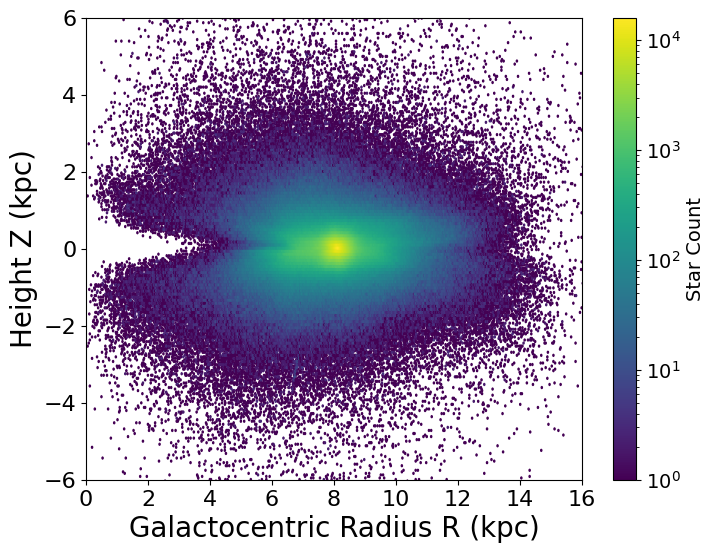

In [8]:
plt.figure(figsize=(8, 6))
#plotting the R vs Z, where the color gives the star count
#We are using the hexbins, so that we can see the large dataset in a more readable format
hb = plt.hexbin(df_subset['R_kpc'], df_subset['Z_kpc'], gridsize=500, cmap='viridis', bins='log')#logbins for large data
cbar = plt.colorbar(hb)  # Add a colorbar
cbar.set_label('Star Count', fontsize=14)
cbar.ax.tick_params(labelsize=14)
plt.xlabel('Galactocentric Radius R (kpc)',fontsize = 20)
plt.ylabel('Height Z (kpc)',fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.title('')
plt.ylim(-6,6)
plt.xlim(0,16)
plt.savefig('R_Z_starcount.png')
plt.show()

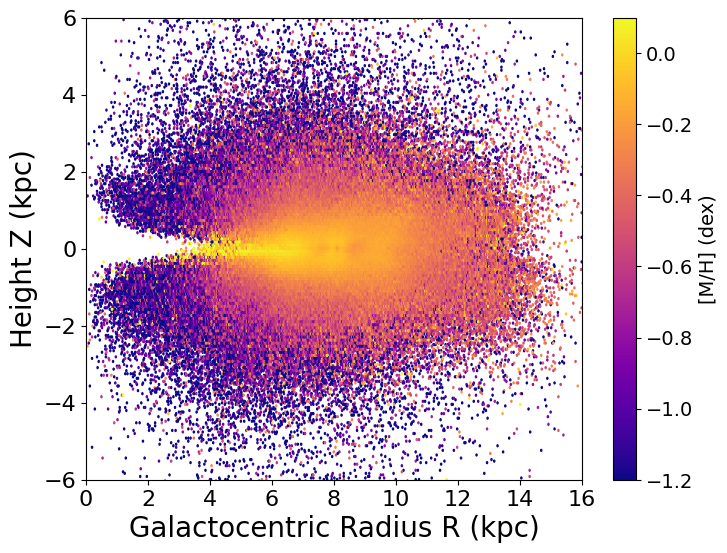

In [9]:
plt.figure(figsize=(8, 6))
#plotting the Rvs Z and mapped with the [M/H]
hb = plt.hexbin(df_subset['R_kpc'], df_subset['Z_kpc'],C=df_subset['mh_gspspec'],gridsize=500,vmin = -1.2,vmax=0.1, cmap='plasma')
cbar = plt.colorbar(hb)  
cbar.set_label('[M/H] (dex)', fontsize=14)
cbar.ax.tick_params(labelsize=14)
plt.xlabel('Galactocentric Radius R (kpc)',fontsize = 20)
plt.ylabel('Height Z (kpc)',fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.title('')
plt.ylim(-6,6)
plt.xlim(0,16)
plt.savefig('R_Z_metallicity.png')
plt.show()


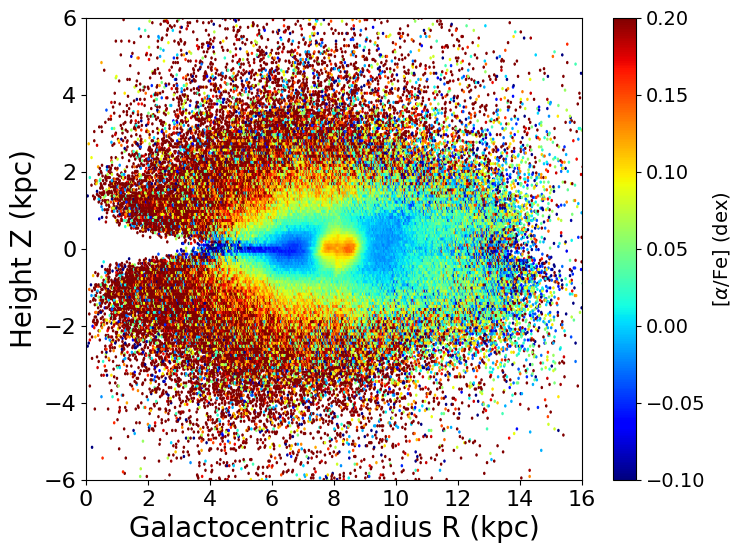

In [10]:
plt.figure(figsize=(8, 6))
#plotting the Rvs Z and mapped with the [alpha/Fe]
hb = plt.hexbin(df_subset['R_kpc'], df_subset['Z_kpc'],C=df_subset['alphafe_gspspec'],
                gridsize=500,vmin = -0.1,vmax=0.2, cmap='jet')
cbar = plt.colorbar(hb)  # Add a colorbar with a label
cbar.set_label(r'[$\alpha$/Fe] (dex)', fontsize=14)
cbar.ax.tick_params(labelsize=14)
plt.xlabel('Galactocentric Radius R (kpc)',fontsize = 20)
plt.ylabel('Height Z (kpc)',fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.title('')
plt.ylim(-6,6)
plt.xlim(0,16)
plt.savefig('R_Z_alphafe.png')
plt.show()


Below we plotted the histograms of each parameter to understand there distributions and spread in there values.

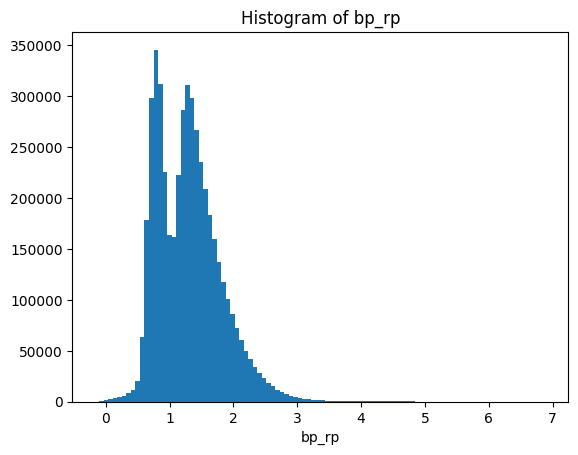

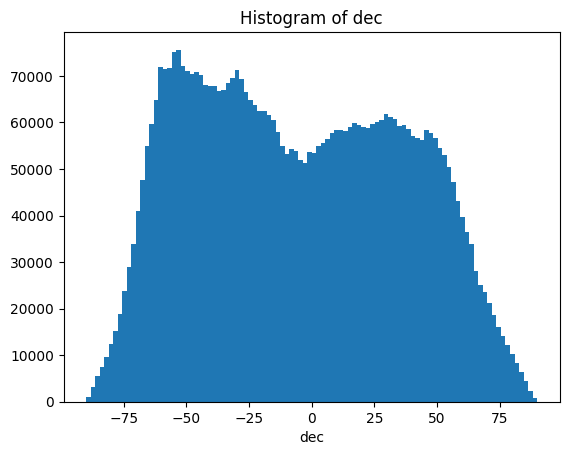

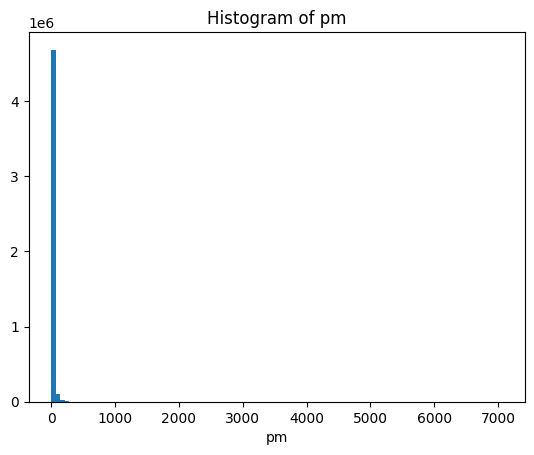

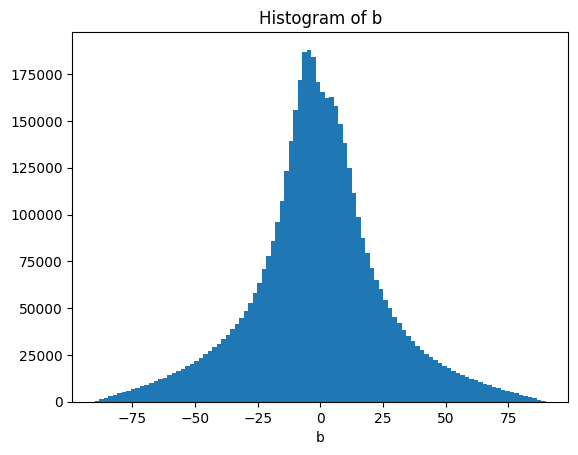

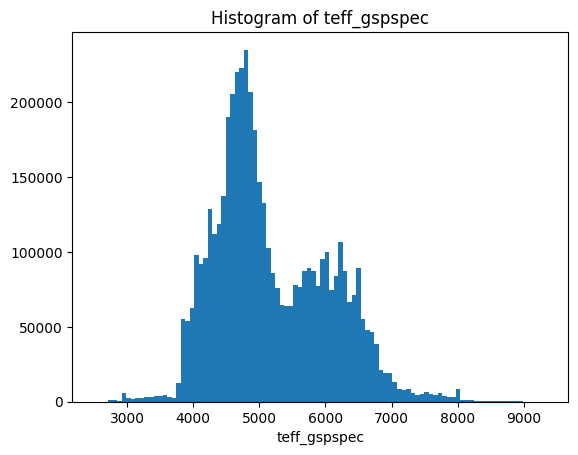

...

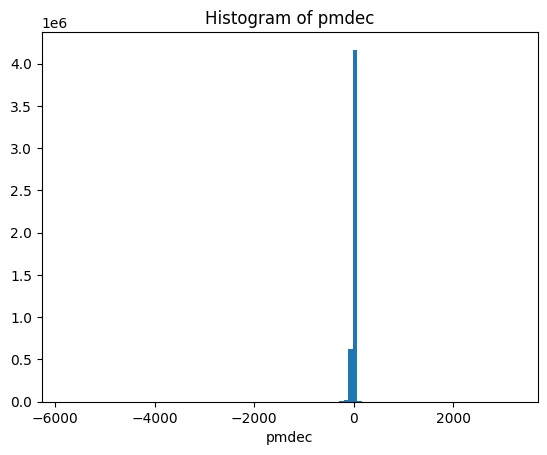

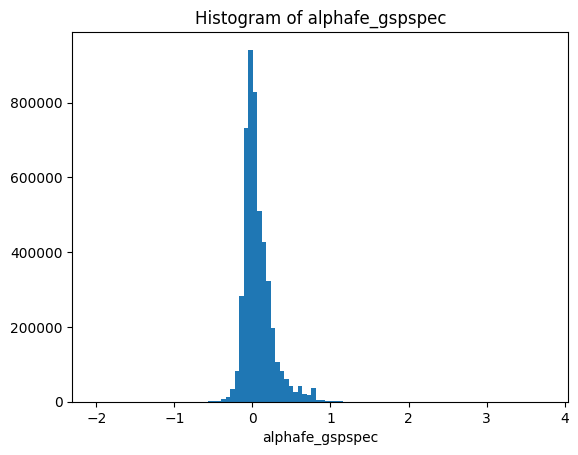

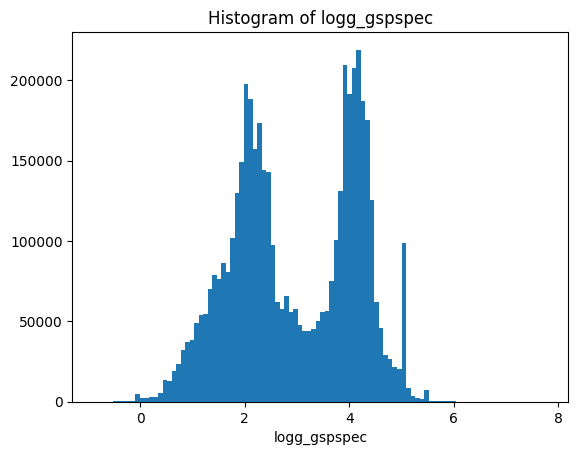

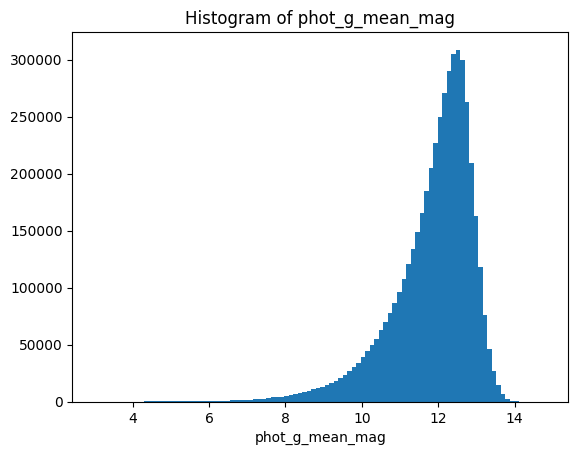

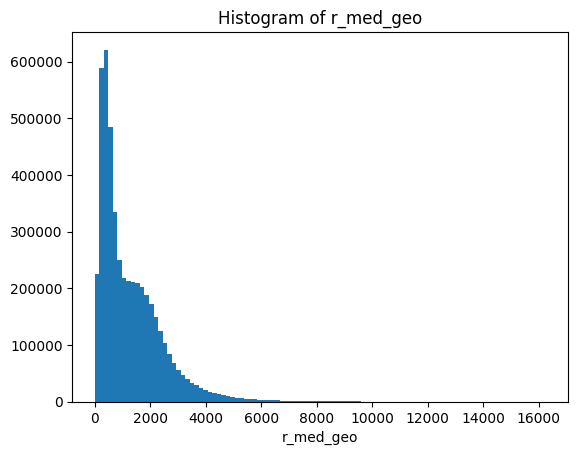

/usr/local/lib/python3.11/dist-packages/numpy/lib/histograms.py:825: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/usr/local/lib/python3.11/dist-packages/numpy/lib/histograms.py:826: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


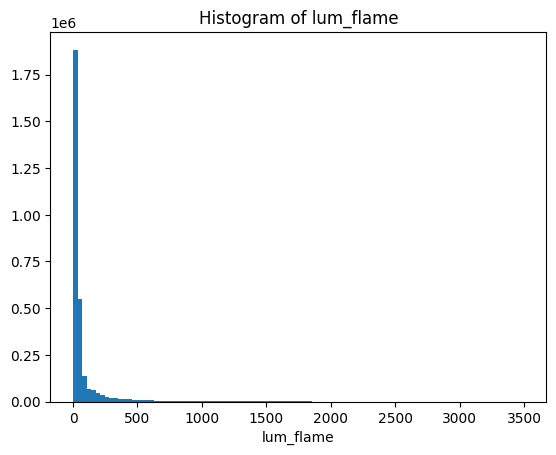

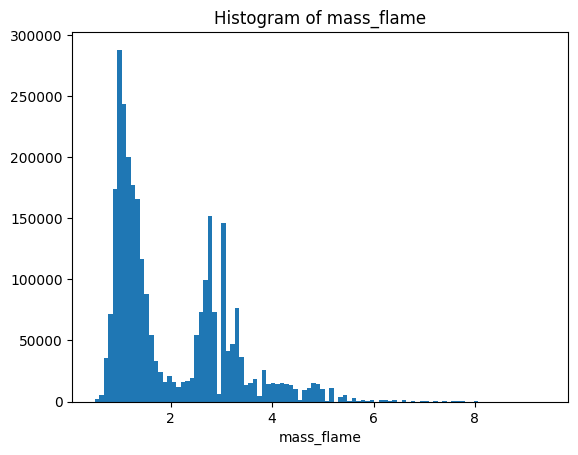

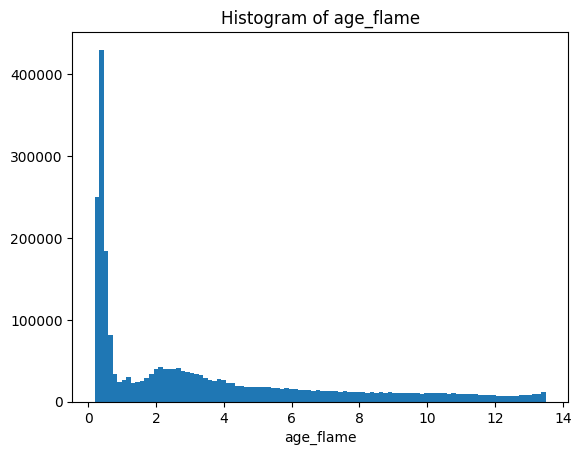

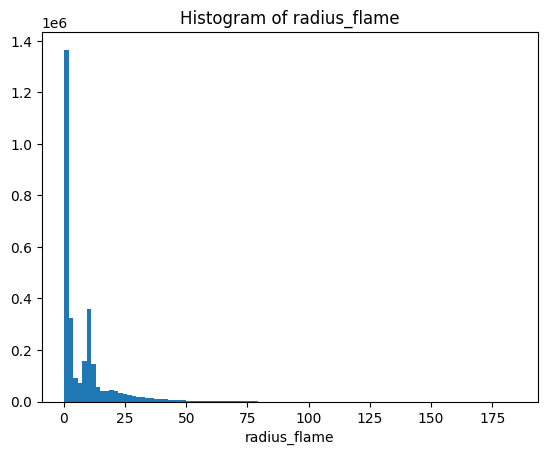

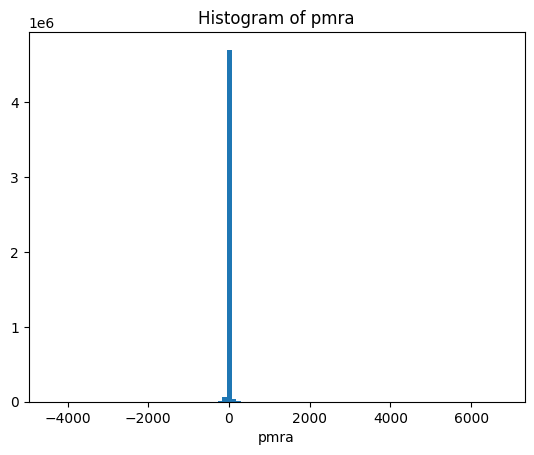

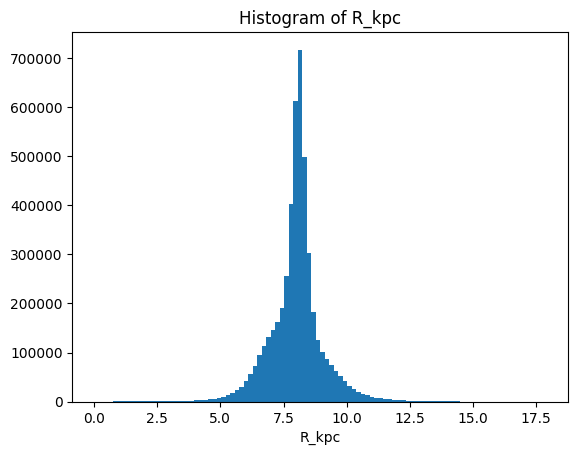

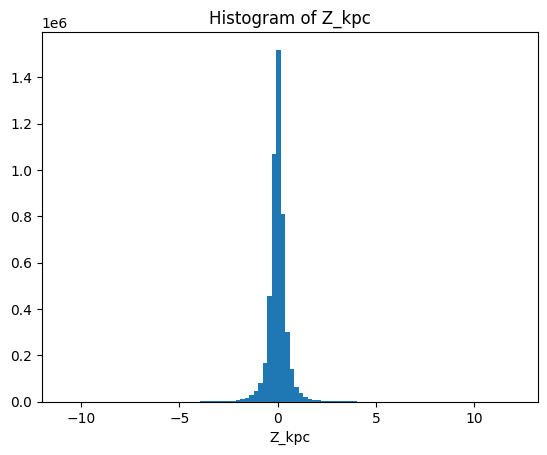

In [11]:
#plotting the distribution of all parameters to understand there underlying distribution
cols = ['bp_rp', 'dec','pm','b', 'teff_gspspec', 'parallax', 'mh_gspspec','l',
        'radial_velocity', 'ra', 'pmdec','alphafe_gspspec', 'logg_gspspec', 
        'phot_g_mean_mag','r_med_geo','lum_flame', 
        'mass_flame','age_flame', 'radius_flame', 'pmra', 'R_kpc', 'Z_kpc']
for i in cols:
    plt.hist(df_subset[i],bins=100)
    plt.xlabel(i)
    plt.title(f'Histogram of {i}')
    plt.show()

In [11]:
#Droping some more nan columns as we will be calculating the Pearson Correlation and Spearman Correlation
subset = df_subset.dropna(subset=['lum_flame','mass_flame','age_flame'])

Finally we were checkign the corelation of stellar parameter with the metallicity values. Though we didnt find out any strong corelations, in some parameters there is corelation with the metallicity.

We used the Pearson's corrlation coefficient and Spearman's correlation formulas to get the correlations.

In [13]:
from scipy import stats

for i in cols:
    print('\n',i)
    print("skewness",stats.skew(subset[i]))
    print("kurtosis",stats.kurtosis(subset[i]))

    print("Correlation with M/H",stats.pearsonr(subset[i], subset['mh_gspspec']))
    print("Correlation with alpha_fe",stats.pearsonr(subset[i], subset['alphafe_gspspec']))
    print("Spearman correlation with M/H",stats.spearmanr(subset[i], subset['mh_gspspec']))
    print("Spearman correlation with alpha_fe",stats.spearmanr(subset[i], subset['alphafe_gspspec']))


 bp_rp
skewness 0.8479350254830399
kurtosis 0.8254557050546749
Correlation with M/H PearsonRResult(statistic=0.1017227165206398, pvalue=0.0)
Correlation with alpha_fe PearsonRResult(statistic=-0.46224126120034537, pvalue=0.0)
Spearman correlation with M/H SignificanceResult(statistic=0.09059611277872118, pvalue=0.0)
Spearman correlation with alpha_fe SignificanceResult(statistic=-0.5480082172137659, pvalue=0.0)

 dec
skewness 0.08102951199059895
kurtosis -1.0673783062826494
Correlation with M/H PearsonRResult(statistic=-0.014184945262947495, pvalue=7.002014885880495e-116)
Correlation with alpha_fe PearsonRResult(statistic=0.02688636177217799, pvalue=0.0)
Spearman correlation with M/H SignificanceResult(statistic=-0.022304576737434554, pvalue=1.555537525500101e-283)
Spearman correlation with alpha_fe SignificanceResult(statistic=0.03701703048537593, pvalue=0.0)

 pm
skewness 11.761495469752967
kurtosis 922.6841030240807
Correlation with M/H PearsonRResult(statistic=0.005443158111191689

To see the above corelations we also plotted the scatter plot between the parameters and the metallicity and  $[\alpha/Fe]$.
From the scatter plot not only the linear corelatinos , but we can see some intersting patterns in the metallicity.
For example above and below the galactic plane has less metal poor stars and more metal rich stars, whil in the galactic plane mostly metal neutral(sun like) stars are present.

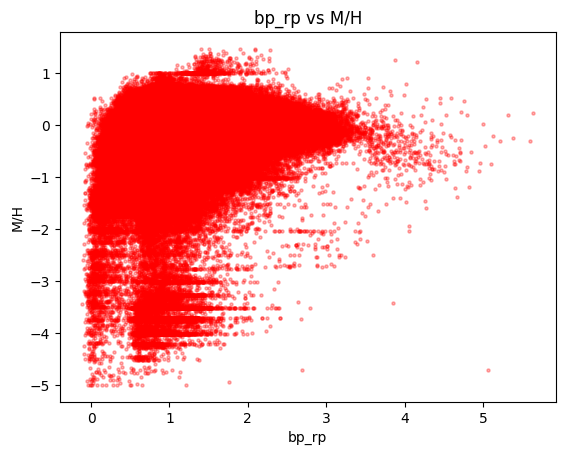

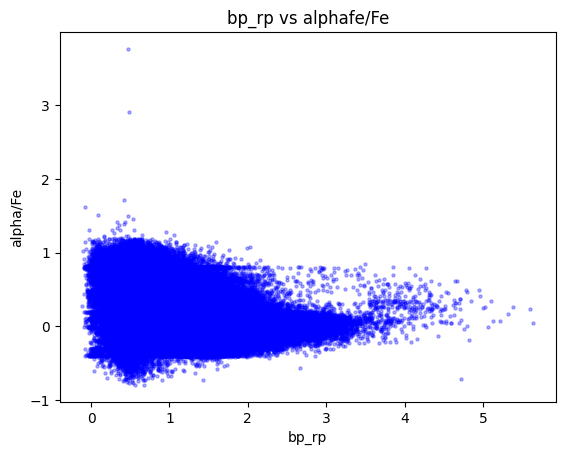

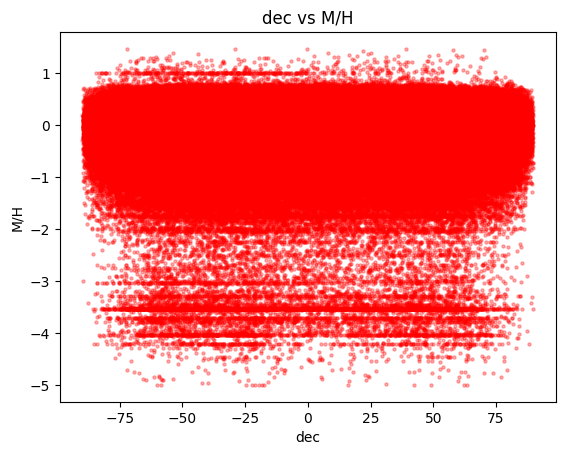

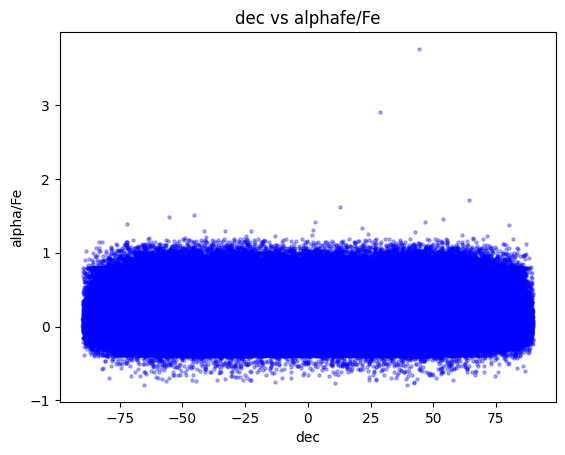

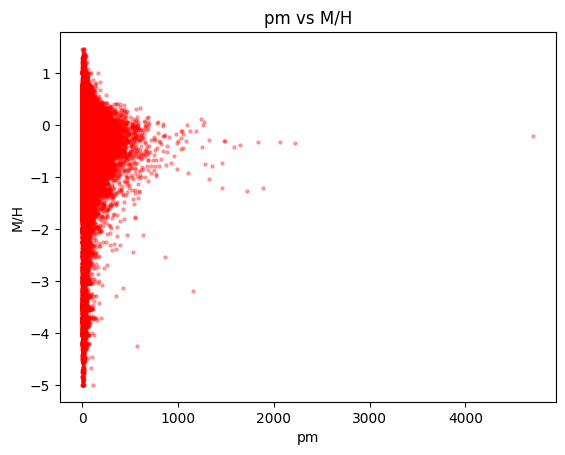

...

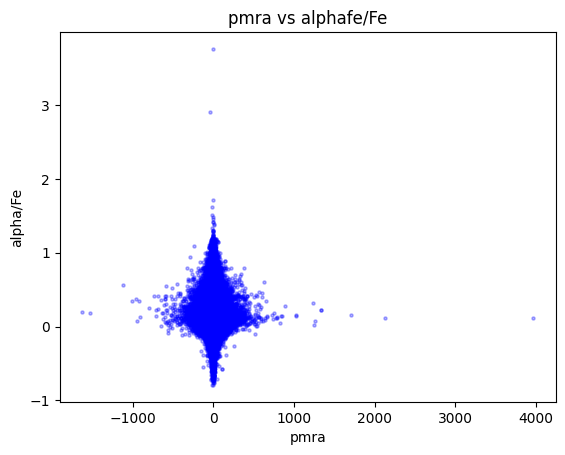

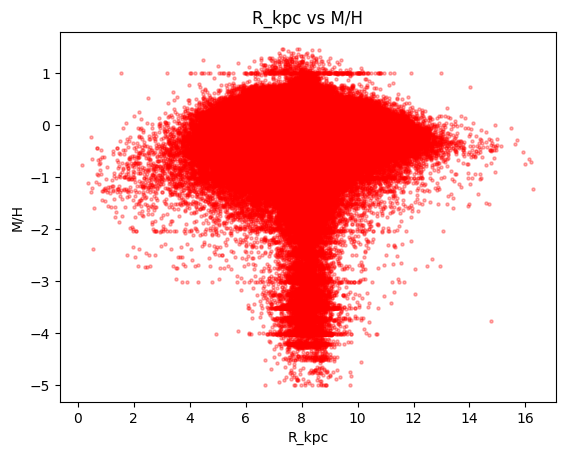

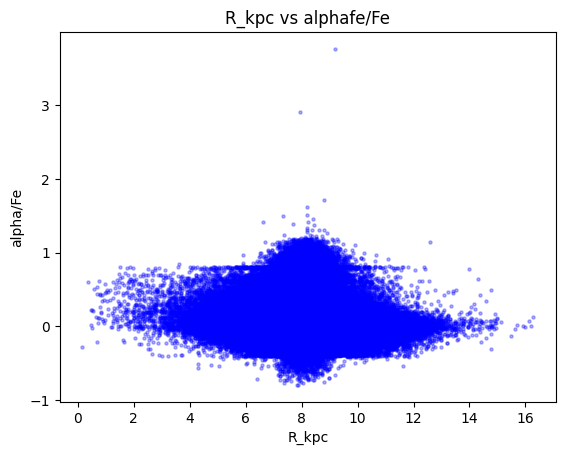

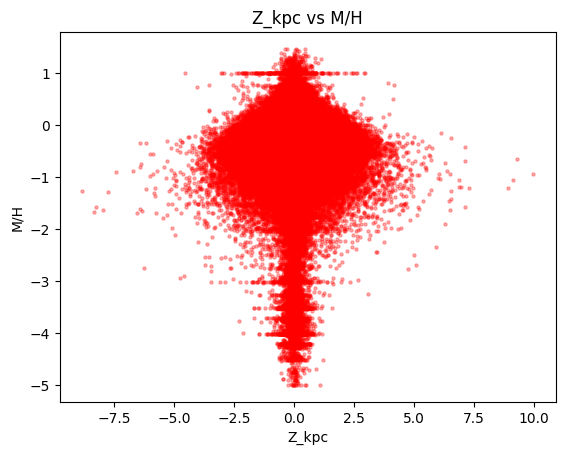

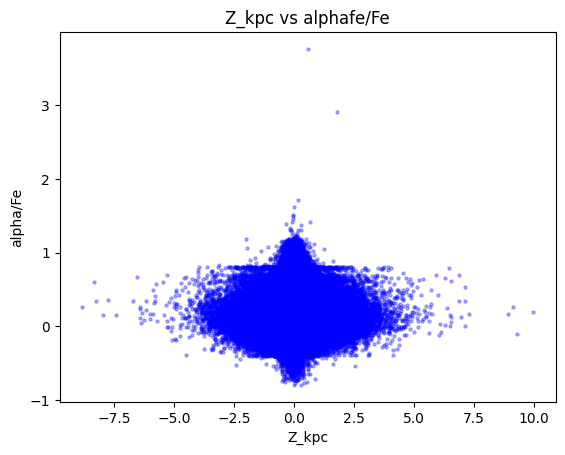

In [14]:
#Plotting the scatter plot of each variable with the [M/H] and [alpha/Fe]
# We already calculate the correlation values and this will give us the visual depiction
#of relation of parameters with the metallicity and alpha abundance
for i in cols:

    plt.scatter(subset[i],subset['mh_gspspec'],c='red',s = 5,alpha=0.3)
    plt.title(f'{i} vs M/H')
    plt.xlabel(i)
    plt.ylabel('M/H')
    plt.show()
    
    plt.scatter(subset[i],subset['alphafe_gspspec'],c='blue',s = 5,alpha=0.3)
    plt.title(f'{i} vs alphafe/Fe')
    plt.xlabel(i)
    plt.ylabel('alpha/Fe')
    plt.show()

Additionally to clearly visualize the metallicity and [$\alpha/Fe$] distribution in the halo region stars and disk region stars, we plotted the Toomre diagram. Here, we plot the galactocentric velocities of the stars and get their location through their kinematical behaviour.

First, we transform the proper motion of the star in ra, dec direction and the radial velocity in the Galacto centric velocity, whose three components give us - 

U - Velocity towards the centre of the Galaxy
V - Tangential velocity (along the rotation of Galaxy)
W - Vertical velocity (towards the North Galactic Pole)

We mapped the metallicity and [$\alpha/Fe$] with the tomre diagram which clearly reveals some intersting patterns in the Galaxy.

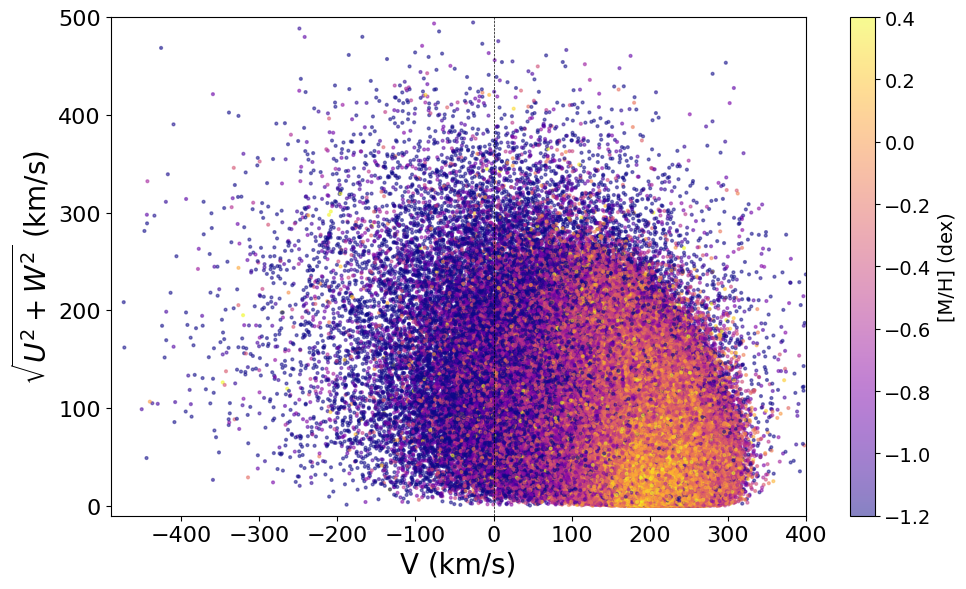

In [15]:
#Plotting the Toomre Diagram which will clearly shows the sample of the data from halo region, disk region
#and also mapped with metallicity and alpha abundance
from astropy.coordinates import CartesianDifferential
from astropy.coordinates import galactocentric_frame_defaults

# Use latest galactocentric frame defaults
galactocentric_frame_defaults.set('v4.0')

# SkyCoord object for getting the velocity components
coords = SkyCoord(
    ra=df_subset['ra'].values * u.deg,
    dec=df_subset['dec'].values * u.deg,
    distance=df_subset['r_med_geo'].values *u.pc,
    pm_ra_cosdec=df_subset['pmra'].values * u.mas/u.yr,
    pm_dec=df_subset['pmdec'].values * u.mas/u.yr,
    radial_velocity=df_subset['radial_velocity'].values * u.km/u.s
)

# Transform to Galactocentric frame
gc = coords.transform_to(Galactocentric())

# velocity components
uvw = gc.velocity.d_xyz.to(u.km/u.s)
U = uvw[0].value  # toward Galactic center
V = uvw[1].value  # in direction of rotation
W = uvw[2].value  # toward North Galactic Pole

# sqrt(U^2 + W^2) vs V
toomre = np.sqrt(U**2 + W**2)

plt.figure(figsize=(10,6))
plt.scatter(V, toomre, s=4, alpha=0.5, c=df_subset['mh_gspspec'],cmap='plasma',vmin=-1.2,vmax=0.4)
cbar = plt.colorbar()  
cbar.set_label('[M/H] (dex)', fontsize=14)
cbar.ax.tick_params(labelsize=14)
plt.xlabel('V (km/s)',fontsize=20)
plt.ylabel(r'$\sqrt{U^2 + W^2}$ (km/s)',fontsize=20)
plt.title('')
plt.axvline(0, color='k', ls='--', lw=0.5)
plt.xlim(-490,400)
plt.ylim(-10,500)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()
plt.savefig('toomre_diagram.png')
plt.show()

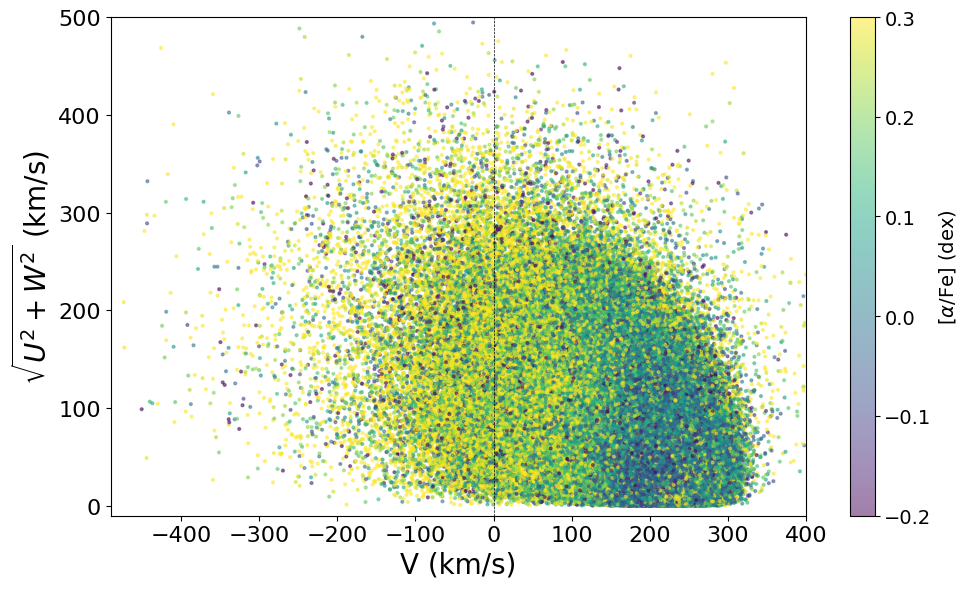

In [16]:
plt.figure(figsize=(10,6))
plt.scatter(V, toomre, s=4, alpha=0.5, c=df_subset['alphafe_gspspec'],cmap='viridis',vmin=-0.2,vmax=0.3)
cbar = plt.colorbar() 
cbar.set_label(r'[$\alpha$/Fe] (dex)', fontsize=14)
cbar.ax.tick_params(labelsize=14)
plt.xlabel('V (km/s)',fontsize=20)
plt.ylabel(r'$\sqrt{U^2 + W^2}$ (km/s)',fontsize=20)
plt.title('')
plt.axvline(0, color='k', ls='--', lw=0.5)
#plt.axhline(0, color='k', ls='--', lw=0.5)
plt.xlim(-490,400)
plt.ylim(-10,500)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()
plt.savefig('toomre_diagram_alpha.png')
plt.show()

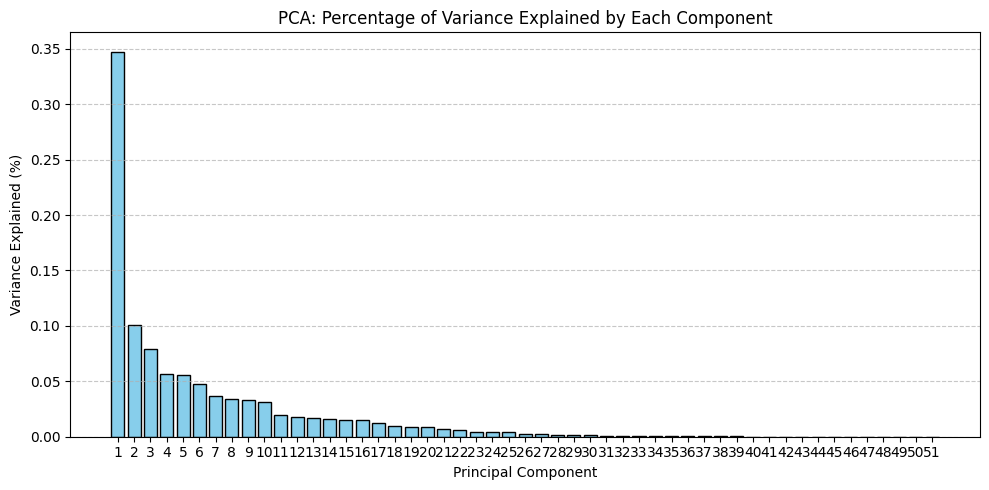

In [12]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardize
scaler = StandardScaler()
subset_scaled = scaler.fit_transform(subset)

pca = PCA()
subset_pca = pca.fit_transform(subset_scaled)

# Assuming `pca` is already fitted as shown before:
explained_var = pca.explained_variance_ratio_

plt.figure(figsize=(10, 5))
plt.bar(range(1, len(explained_var) + 1), explained_var, color='skyblue', edgecolor='black')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained (%)')
plt.title('PCA: Percentage of Variance Explained by Each Component')
plt.xticks(range(1, len(explained_var) + 1))
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

Number of components to retain 95% variance: 19


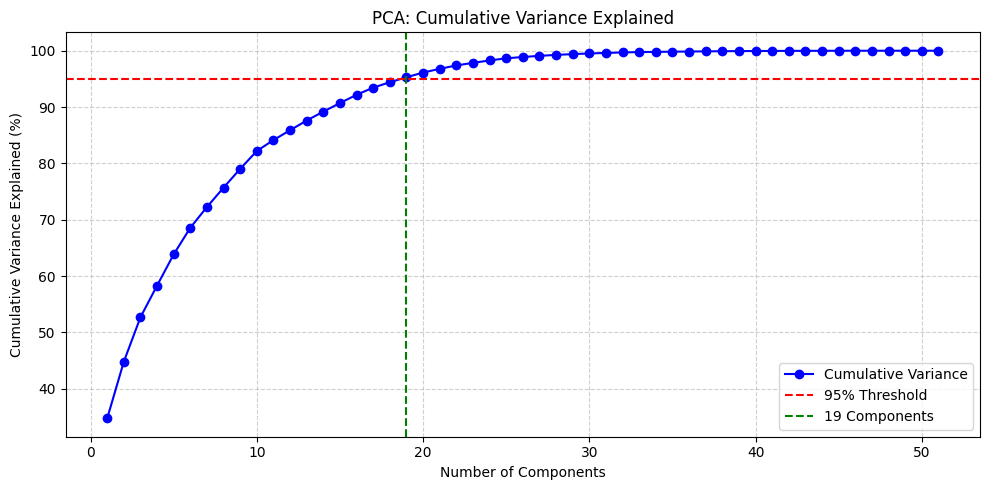

In [13]:
# Cumulative variance
cumulative_var = np.cumsum(explained_var)

# Find number of components to reach 95% variance
threshold = 0.95
n_components_95 = np.argmax(cumulative_var >= threshold) + 1
print(f"Number of components to retain {threshold*100:.0f}% variance: {n_components_95}")

# Plot cumulative variance
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(cumulative_var) + 1), cumulative_var * 100, marker='o', color='blue', label='Cumulative Variance')
plt.axhline(y=threshold * 100, color='r', linestyle='--', label=f'{threshold*100:.0f}% Threshold')
plt.axvline(x=n_components_95, color='g', linestyle='--', label=f'{n_components_95} Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance Explained (%)')
plt.title('PCA: Cumulative Variance Explained')
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend()
plt.tight_layout()
plt.show()


In [14]:
pca_95 = PCA(n_components=n_components_95)
subset_reduced = pca_95.fit_transform(subset_scaled)

1
2
3
4
5


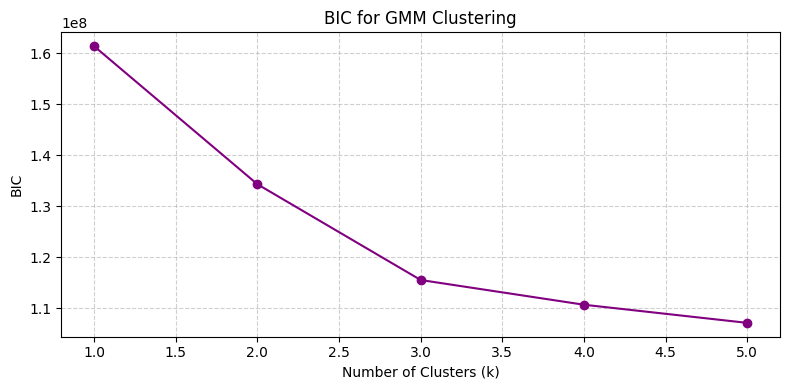

In [17]:
from sklearn.mixture import GaussianMixture

bics = []
K_range = range(1, 6)

for k in K_range:
    print(k)
    gmm = GaussianMixture(n_components=k, covariance_type='full', random_state=0)
    gmm.fit(subset_reduced)  # or subset_reduced
    bics.append(gmm.bic(subset_reduced))

plt.figure(figsize=(8, 4))
plt.plot(K_range, bics, marker='o', color='purple')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('BIC')
plt.title('BIC for GMM Clustering')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


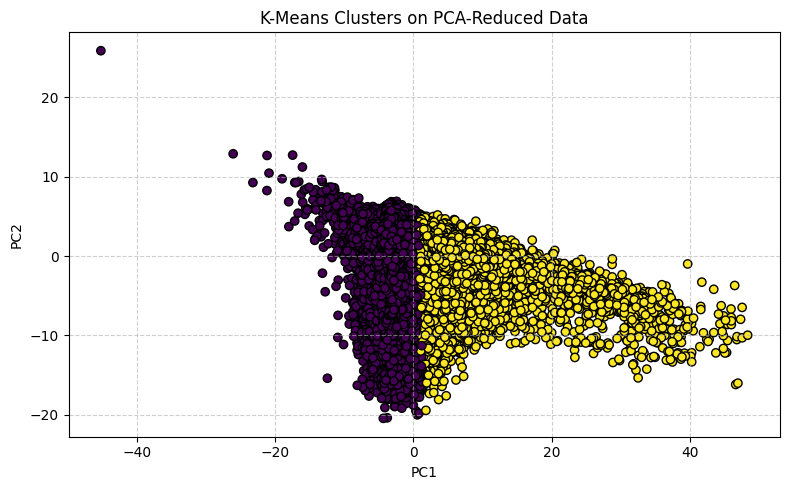

In [18]:
from sklearn.cluster import KMeans

# Assume subset_reduced is your PCA-reduced dataset
kmeans = KMeans(n_clusters=2, random_state=0)
labels = kmeans.fit_predict(subset_reduced)

# Optional: plot in 2D if you kept at least 2 PCs
plt.figure(figsize=(8, 5))
plt.scatter(subset_reduced[:, 0], subset_reduced[:, 1], c=labels, cmap='viridis', edgecolor='k')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('K-Means Clusters on PCA-Reduced Data')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [21]:
gmm = GaussianMixture(n_components=2, random_state=0)
labels = gmm.fit_predict(subset_reduced)

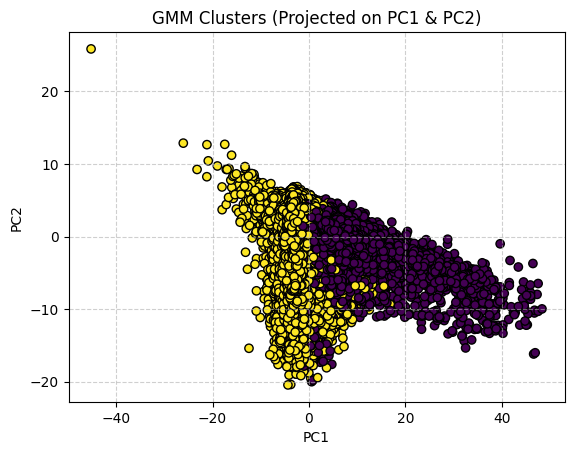

In [22]:
plt.scatter(subset_reduced[:, 0], subset_reduced[:, 1], c=labels, cmap='viridis', edgecolor='k')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('GMM Clusters (Projected on PC1 & PC2)')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

We also calculated the radial gradient of the metallicity for different different vertical heights. We can check how the median metallicity and [$\alpha/Fe$]is changing with the smooth way. Here, we binned the data according to the radial distance (R) and also for different Z-ranges we create a window from the radial bin calculate the median then slide the window with the overlapping of the data and calculate the median and so on. We considered the overlapping of the data to remove discontinuites and smmothen the gradient also we used the poisson error associated with each bins to add measure of uncertainity. We repeated this for the vertical gradients also.

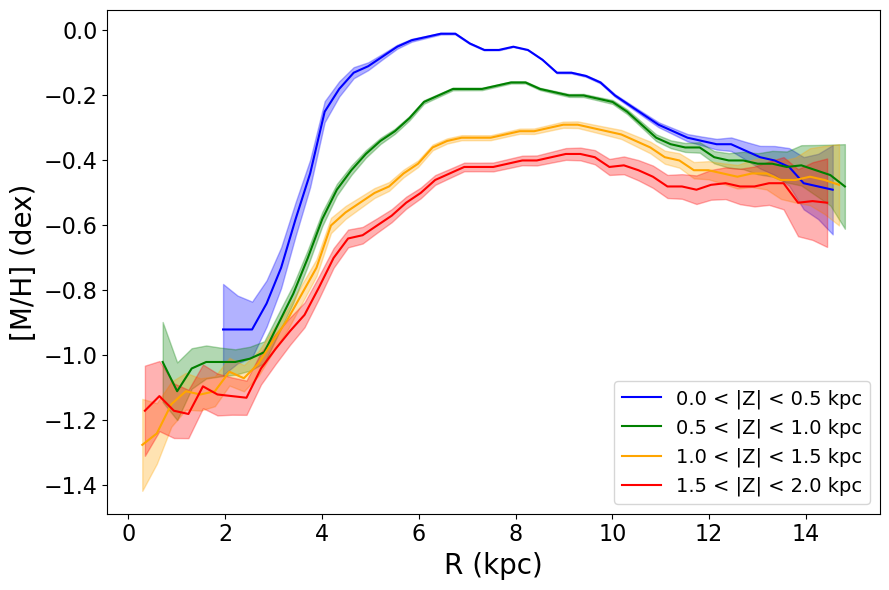

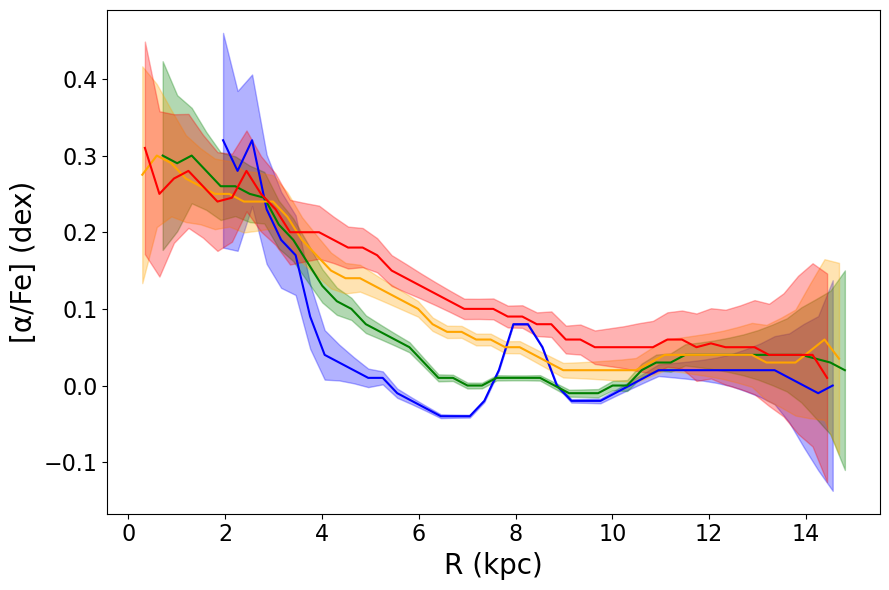

In [28]:
bin_width = 0.5  # kpc
overlap_fraction = 0.4
min_stars_per_bin = 50

z_bins = [(0.0, 0.5), (0.5, 1.0), (1.0, 1.5), (1.5, 2.0)]  # Z ranges
colors = ['blue', 'green', 'orange', 'red']  # colors for Z bin

def running_median(df, r_col, y_col, bin_width=0.5, overlap=0.4, min_count=50):
    r_min, r_max = df[r_col].min(), df[r_col].max()
    step = bin_width * (1 - overlap)
    bins = np.arange(r_min, r_max - bin_width + step, step)

    centers, medians, errors = [], [], []

    for start in bins:
        end = start + bin_width
        bin_df = df[(df[r_col] >= start) & (df[r_col] < end)]

        if len(bin_df) >= min_count:
            median = bin_df[y_col].median()
            N = len(bin_df)
            error = 1 / np.sqrt(N)  # Poisson error

            centers.append((start + end) / 2)
            medians.append(median)
            errors.append(error)

    return np.array(centers), np.array(medians), np.array(errors)

def plot_radial_gradient(df, y_col, ylabel, title,show_legend=True):
    plt.figure(figsize=(9, 6))

    for (zmin, zmax), color in zip(z_bins, colors):
        # Select stars in Z bin
        sub = df[(df['Z_kpc'].abs() >= zmin) & (df['Z_kpc'].abs() < zmax)]
        sub = sub[[y_col, 'R_kpc']].dropna()

        if len(sub) < min_stars_per_bin:
            continue  # skip it to get min stars

        R, y_median, y_err = running_median(sub, 'R_kpc', y_col,
                                            bin_width, overlap_fraction, min_stars_per_bin)

        label = f'{zmin:.1f} < |Z| < {zmax:.1f} kpc'
        plt.plot(R, y_median, color=color, label=label)
        plt.fill_between(R, y_median - y_err, y_median + y_err,
                         color=color, alpha=0.3)

    plt.xlabel('R (kpc)',fontsize = 20)
    plt.ylabel(ylabel,fontsize = 20)
    plt.title('')
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    #plt.grid(True)
    if show_legend:
        plt.legend(fontsize=14)
    plt.tight_layout()
    plt.savefig(f'{title}.png')
    plt.show()
    

plot_radial_gradient(df_subset, 'mh_gspspec', '[M/H] (dex)', 'rad_mh_grad',show_legend=True)
plot_radial_gradient(df_subset, 'alphafe_gspspec', r'[$\alpha$/Fe] (dex)', 'rad_alphafe_grad',show_legend=False)


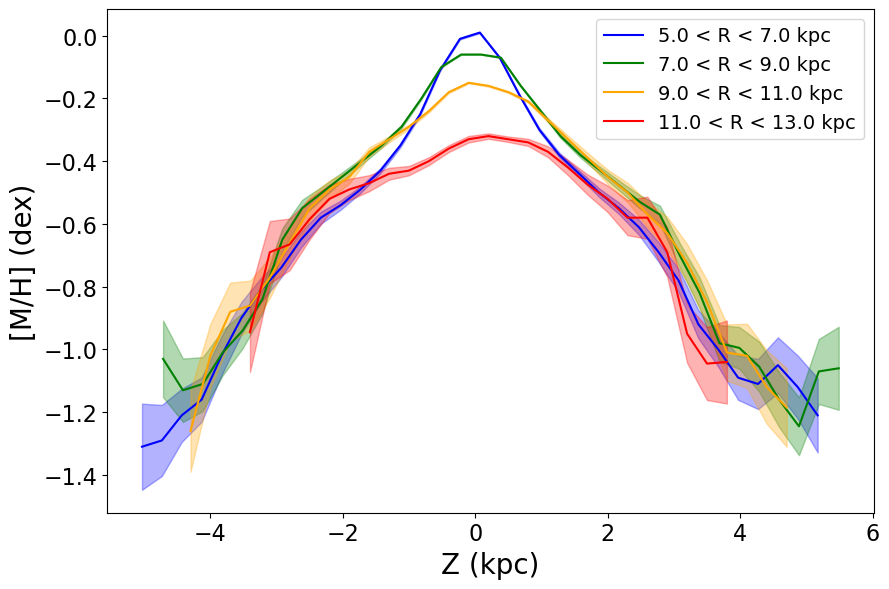

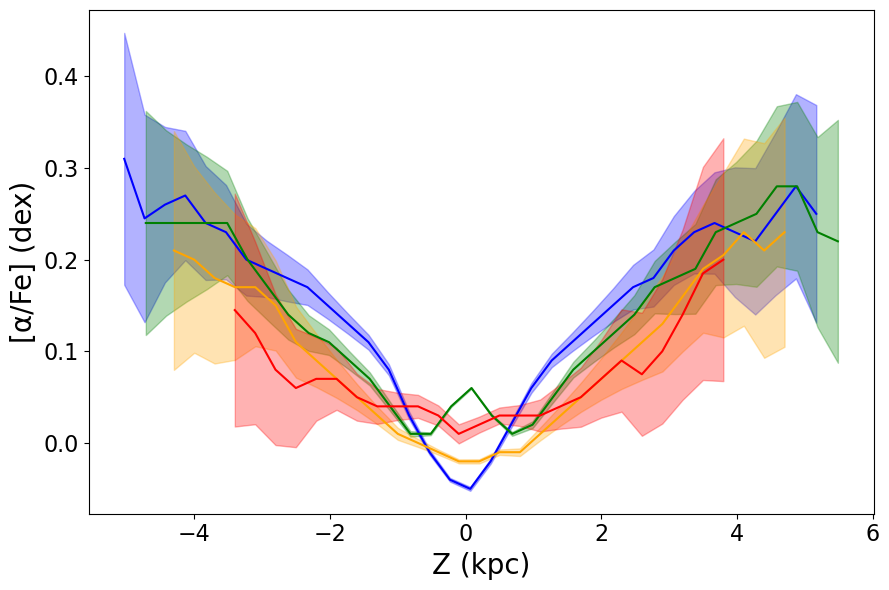

In [29]:
bin_width = 0.5 # kpc
overlap_fraction = 0.4
min_stars_per_bin = 50

z_bins = [(5, 7), (7, 9), (9, 11), (11, 13)]  # R slices
colors = ['blue', 'green', 'orange', 'red']  # colour coing for the R binning

def running_median(df, r_col, y_col, bin_width=0.5, overlap=0.4, min_count=50):
    r_min, r_max = df[r_col].min(), df[r_col].max()
    step = bin_width * (1 - overlap)
    bins = np.arange(r_min, r_max - bin_width + step, step)

    centers, medians, errors = [], [], []

    for start in bins:
        end = start + bin_width
        bin_df = df[(df[r_col] >= start) & (df[r_col] < end)]

        if len(bin_df) >= min_count:
            median = bin_df[y_col].median()
            N = len(bin_df)
            error = 1 / np.sqrt(N)  # Poisson error

            centers.append((start + end) / 2)
            medians.append(median)
            errors.append(error)

    return np.array(centers), np.array(medians), np.array(errors)

def plot_radial_gradient(df, y_col, ylabel, title,show_legend=True):
    plt.figure(figsize=(9, 6))

    for (zmin, zmax), color in zip(z_bins, colors):
        # Select stars in Z bin
        sub = df[(df['R_kpc'].abs() >= zmin) & (df['R_kpc'].abs() < zmax)]
        sub = sub[[y_col, 'Z_kpc']].dropna()

        if len(sub) < min_stars_per_bin:
            continue  # skip if too few stars

        R, y_median, y_err = running_median(sub, 'Z_kpc', y_col,
                                            bin_width, overlap_fraction, min_stars_per_bin)

        label = f'{zmin:.1f} < R < {zmax:.1f} kpc'
        plt.plot(R, y_median, color=color, label=label)
        plt.fill_between(R, y_median - y_err, y_median + y_err,
                         color=color, alpha=0.3)

    plt.xlabel('Z (kpc)',fontsize = 20)
    plt.ylabel(ylabel,fontsize = 20)
    plt.title('')
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    if show_legend:
        plt.legend(fontsize=14)
    plt.tight_layout()
    plt.savefig(f'{title}.png')
    plt.show()
    

plot_radial_gradient(df_subset, 'mh_gspspec', '[M/H] (dex)', 'vertical_mh_grad',show_legend=True)
plot_radial_gradient(df_subset, 'alphafe_gspspec', r'[$\alpha$/Fe] (dex)', 'vertical_alphafe_grad',show_legend=False)


Kiel diagram is different version of the HR diagram, where we plot the log of surface gravity of the star vs the effective temperature of the star. As we are studying the metallicity using kiel diagram is more beneficial than the HR diagram, in the kiel diagram we can cleaarly see the main sequence and red gian branch stars , easier to distinguish the stat in stellar evolution. We can see the metallicity pattern is changing with the evolutionary phase of the galaxy (metallicity in the old stars and in the younger stars).

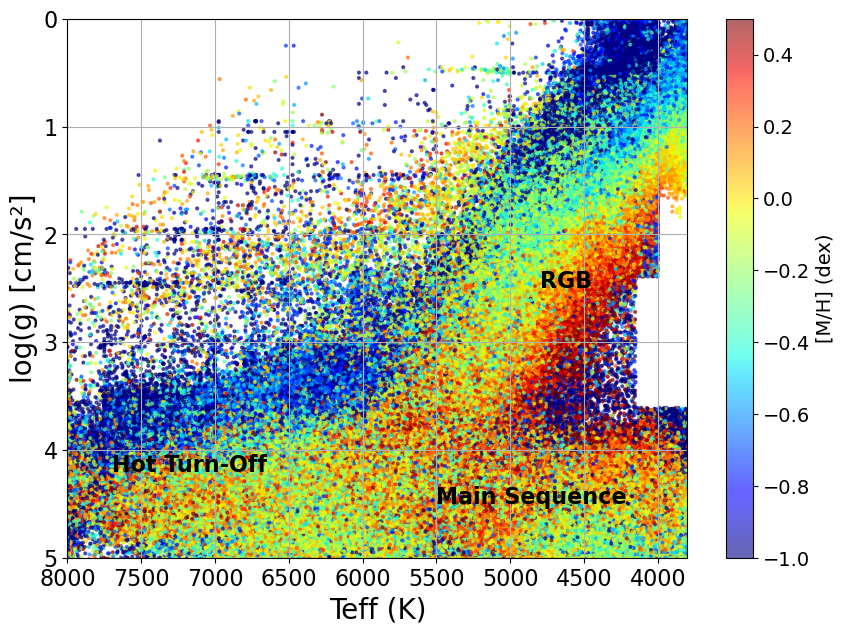

In [15]:
import matplotlib.pyplot as plt
import pandas as pd

plt.figure(figsize=(10, 7))
sc = plt.scatter(df_subset["teff_gspspec"], df_subset["logg_gspspec"], c=df_subset["mh_gspspec"], cmap="jet",
                 s=4, alpha=0.6, vmin=-1.0, vmax=0.5)
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.xlim(8000,3800)
plt.ylim(5,0)
# Colorbar
cbar = plt.colorbar(sc)
cbar.set_label("[M/H] (dex)",fontsize=14)
cbar.ax.tick_params(labelsize=14)

plt.text(4800, 2.5, 'RGB', color='black', fontsize=16, weight='bold')
plt.text(7700, 4.2, 'Hot Turn-Off', color='black', fontsize=16, weight='bold')
plt.text(5500, 4.5, 'Main Sequence', color='black', fontsize=16, weight='bold')

# Additional plot settings
plt.xlabel('Teff (K)',fontsize=20)
plt.ylabel('log(g) [cm/s²]',size=20) # For log(g) decreasing upward

#plt.colorbar(label='[M/H] (dex)')
plt.grid(True)
plt.savefig('kiel_mh.png')
plt.show()


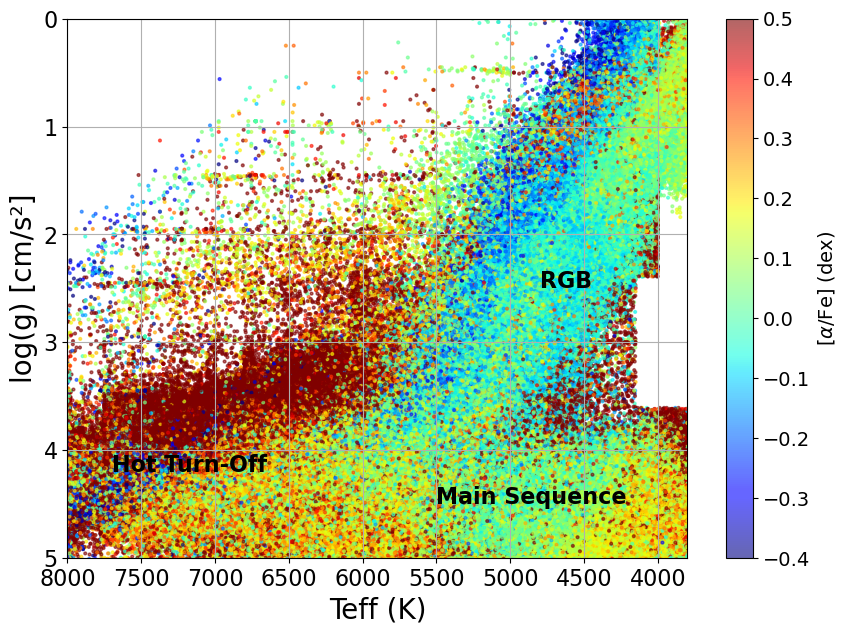

In [16]:

plt.figure(figsize=(10, 7))
sc = plt.scatter(df_subset["teff_gspspec"], df_subset["logg_gspspec"], c=df_subset["alphafe_gspspec"], cmap="jet",
                 s=4, alpha=0.6, vmin=-0.4, vmax=0.5)


plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.xlim(8000,3800)
plt.ylim(5,0)
# Colorbar
cbar = plt.colorbar(sc)
cbar.set_label(r'[$\alpha$/Fe] (dex)',fontsize=14)
cbar.ax.tick_params(labelsize=14)

plt.text(4800, 2.5, 'RGB', color='black', fontsize=16, weight='bold')
plt.text(7700, 4.2, 'Hot Turn-Off', color='black', fontsize=16, weight='bold')
plt.text(5500, 4.5, 'Main Sequence', color='black', fontsize=16, weight='bold')

# Additional plot settings
plt.xlabel('Teff (K)',fontsize=20)
plt.ylabel('log(g) [cm/s²]',fontsize=20) # For log(g) decreasing upward

#plt.colorbar(label='[M/H] (dex)')
plt.grid(True)
plt.savefig('kiel_alpha.png')
plt.show()
